# Ames Real Estate Machine Learning Project


### Yi Cao, Daniel Choy, Ling Ge Zeng

### Objective: The first part of this project explores the characteristics of Ames housing market. The second part of this project includes a comparison of different regression models and assess their test performances

In [52]:
# Import Libraries
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns
import pandas as pd
import matplotlib as mpl
# import chart_studio.plotly as py
import numpy as np
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
# from geopy import Nominatim
# from geopy.extra.rate_limiter import RateLimiter
%matplotlib inline

In [53]:
# Run the file Data_Preprocessing.ipynb which cleaned the data. Pre-processed data are saved in the data file

housing = pd.read_csv('data/Ames_Housing_Price_Data.csv', index_col = 0)
real_estate = pd.read_csv('data/Ames_Real_Estate_Data.csv', index_col = 0)
# combined data set:
ames_df = pd.read_csv('data/final_df.csv', index_col = 0)

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (36,40,81,87) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# Overview of Ames Housing Market

In [54]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df

,Neighborhood,geometry
0,City Center,"POLYGON ((-93.62326 42.06548, -93.62051 42.055..."
1,24th St / Grand Ave,"POLYGON ((-93.62068 42.04579, -93.64017 42.045..."
2,E 13th St / Duff Ave,"POLYGON ((-93.63476 42.03450, -93.63373 42.033..."
3,S Duff Ave / E Lincoln Way,"POLYGON ((-93.57141 42.02896, -93.61656 42.023..."
4,Grand Ave / 30th St,"POLYGON ((-93.64240 42.05643, -93.63450 42.045..."
5,Stange Rd / Pammel Ct,"POLYGON ((-93.64480 42.04540, -93.64480 42.035..."
6,Iowa State University,"POLYGON ((-93.65570 42.03450, -93.65630 42.034..."
7,Woodland St / West St,"POLYGON ((-93.65656 42.02819, -93.66840 42.028..."
8,Ontario,"POLYGON ((-93.69887 42.03457, -93.69905 42.022..."
9,Lincoln Way / 500th Ave,"POLYGON ((-93.69887 42.02245, -93.69879 42.014..."


In [55]:
neighborhood_new = []
for row in ames_df['Neighborhood']:
   if row == 'Blmngtn': neighborhood_new.append('Gilbert')
   if row == 'Blueste': neighborhood_new.append('Lincoln Way / State Ave')
   if row == 'BrDale': neighborhood_new.append('Grand Ave / 30th St')
   if row == 'BrkSide': neighborhood_new.append('E 13th St / Duff Ave')
   if row == 'ClearCr': neighborhood_new.append('Ontario')
   if row == 'CollgCr': neighborhood_new.append('Lincoln Way / 500th Ave')
   if row == 'Crawfor': neighborhood_new.append('S Duff Ave / E Lincoln Way')
   if row == 'Edwards': neighborhood_new.append('Woodland St / West St')
   if row == 'Gilbert': neighborhood_new.append('Gilbert')
   if row == 'IDOTRR' : neighborhood_new.append('S Duff Ave / E Lincoln Way')
   if row == 'MeadowV': neighborhood_new.append('S Duff Ave / Airport Rd')
   if row == 'Mitchel': neighborhood_new.append('S Duff Ave / Airport Rd')
   if row == 'NAmes': neighborhood_new.append('City Center')
   if row == 'NoRidge': neighborhood_new.append('Gilbert')
   if row == 'NPkVill': neighborhood_new.append('Grand Ave / 30th St')
   if row == 'NridgHt': neighborhood_new.append('Gilbert')
   if row == 'NWAmes': neighborhood_new.append('24th St / Grand Ave')
   if row == 'OldTown': neighborhood_new.append('E 13th St / Duff Ave')
   if row == 'SWISU': neighborhood_new.append('Lincoln Way / State Ave')
   if row == 'Sawyer': neighborhood_new.append('Ontario')
   if row == 'SawyerW': neighborhood_new.append('Ontario')
   if row == 'Somerst' : neighborhood_new.append('Grand Ave / 30th St')
   if row == 'StoneBr': neighborhood_new.append('Grand Ave / 30th St')
   if row == 'Timber': neighborhood_new.append('S Duff Ave / Airport Rd')
   if row == 'Veenker': neighborhood_new.append('Stange Rd / Pammel Ct')
   if row == 'Greens': neighborhood_new.append('Stange Rd / Pammel Ct')
ames_df['Neighborhood_New'] = neighborhood_new

In [56]:
ames_df2 = ames_df.copy()

## Ames House Sale Price Distribution

Text(0, 0.5, 'Density')

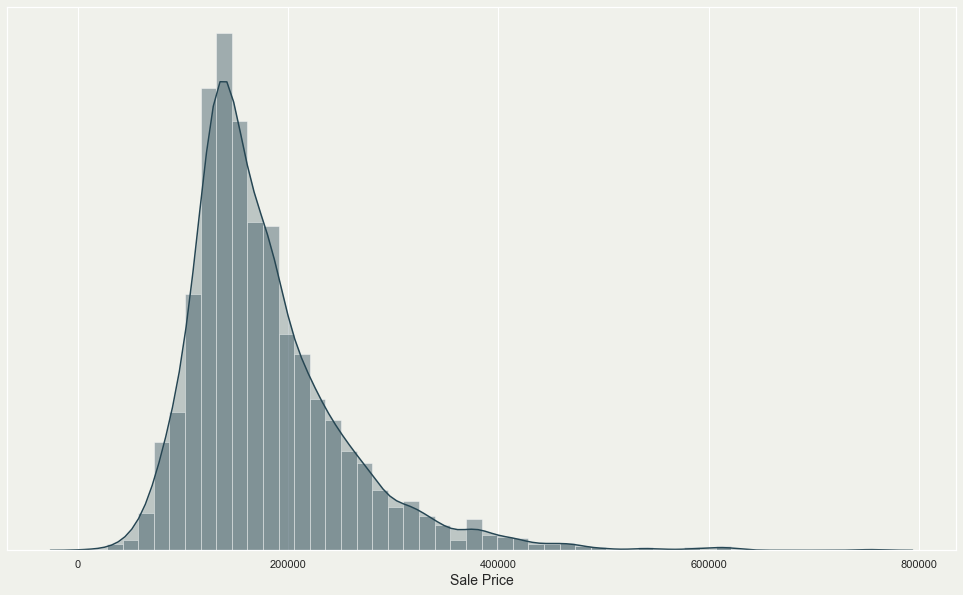

In [50]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
plt.figure(figsize = (17,10))
ax = sns.distplot(ames_df['SalePrice'], kde = True, kde_kws = {'shade': True})
plt.xlabel('Sale Price', fontdict = {'fontsize' : 14})
ax.axes.get_yaxis().set_visible(False)
plt.ylabel('Density', fontdict = {'fontsize' : 14})




#### The distribution graph indicates that Ames housing market has more outliers on the expensive side

## Ames Housing Market Trend

In [58]:
ames_df2['PrPerAbvGrSF'] = ames_df2['SalePrice']/ames_df2['GrLivArea']
ames_df2['PrPerAbvGrSF'].dtypes
pd.to_datetime(ames_df2['YrSold'], format = '%Y')
ames_df2[['YrSold']]

,YrSold
0,2010
1,2009
2,2009
3,2007
4,2009
...,...
2598,2009
2599,2009
2600,2007
2601,2007


In [59]:
ames_df2['YrSold'].dtypes
ames_df2['YrSold'] = pd.to_datetime(ames_df2['YrSold'], format = '%Y')
ames_df2['YrSold'].dtypes
ames_df2['year'] = pd.DatetimeIndex(ames_df2['YrSold']).year
ames_df2['year'].dtypes
ames_df2['year'] = ames_df2.year.astype(str)
MedPrPerAbvGrSF = ames_df2.groupby('year')[['PrPerAbvGrSF']].mean().reset_index()

Text(0, 0.5, 'Sale Price per Square Feet')

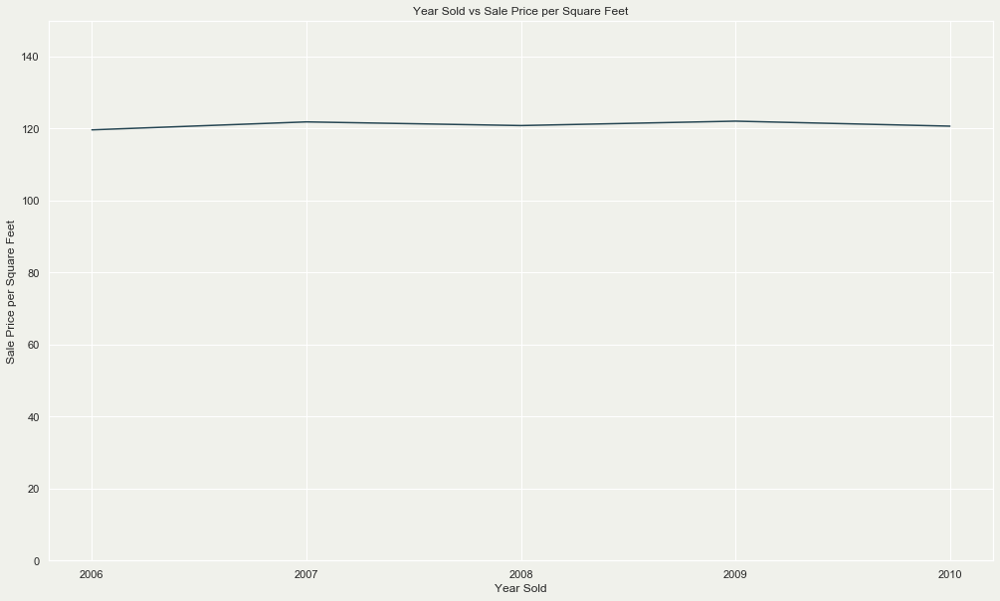

In [206]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

fig, ax1 = plt.subplots(figsize=(17,10))
sns.lineplot(MedPrPerAbvGrSF['year'], MedPrPerAbvGrSF['PrPerAbvGrSF'])
plt.ylim(0, 150)
ax1.set_title('Year Sold vs Sale Price per Square Feet', fontsize=12)
ax1.set_xlabel('Year Sold', fontsize=12)
ax1.set_ylabel('Sale Price per Square Feet', fontsize=12)


#### Ames housing market is relatively stable in terms of per square foot pricing over the years

## Ames Housing Market Overview by Price

In [157]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()
Q1 = np.percentile(ames_df2['SalePrice'], 25, interpolation = 'midpoint')
Q2 = np.percentile(ames_df2['SalePrice'], 50, interpolation = 'midpoint')
Q3 = np.percentile(ames_df2['SalePrice'], 75, interpolation = 'midpoint')
IQR = Q3 - Q1

SalePrice_new = []
for row in ames_df2['SalePrice']:
    if row < 129950.0 : SalePrice_new.append('$')
    elif row < 159500.0 : SalePrice_new.append('$$')
    elif row < 208950.0 : SalePrice_new.append('$$$')
    elif row < 327450.0 : SalePrice_new.append('$$$$')
    else : SalePrice_new.append('$$$$$')
ames_df2['price_type'] = SalePrice_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='$')
feature_2 = folium.FeatureGroup(name='$$')
feature_3 = folium.FeatureGroup(name='$$$')
feature_4 = folium.FeatureGroup(name='$$$$')
feature_5 = folium.FeatureGroup(name='$$$$$')

for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['price_type'], v['Neighborhood'], v['SalePrice'])
    
    if v['price_type'] == '$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['price_type'] == '$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['price_type'] == '$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['price_type'] == '$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)
    elif v['price_type'] == '$$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e76f51',
                            fill_color='#e76f51',
                            fill=True).add_to(feature_5)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
feature_5.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)
locs_map

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


## Ames Housing Market Overview by Price per Square Feet

In [60]:

SalePrice_new = []
for row in ames_df2['PrPerAbvGrSF']:
    if row < 100.5887355495326 : SalePrice_new.append('$')
    elif row < 119.76384498845812 : SalePrice_new.append('$$')
    elif row < 138.9547130068457 : SalePrice_new.append('$$$')
    elif row < 177.32069046415882 : SalePrice_new.append('$$$$')
    else : SalePrice_new.append('$$$$$')
ames_df2['price_type2'] = SalePrice_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='$')
feature_2 = folium.FeatureGroup(name='$$')
feature_3 = folium.FeatureGroup(name='$$$')
feature_4 = folium.FeatureGroup(name='$$$$')
feature_5 = folium.FeatureGroup(name='$$$$$')

for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['price_type2'], v['Neighborhood'], v['PrPerAbvGrSF'])
    
    if v['price_type2'] == '$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['price_type2'] == '$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['price_type2'] == '$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['price_type2'] == '$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)
    elif v['price_type2'] == '$$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e76f51',
                            fill_color='#e76f51',
                            fill=True).add_to(feature_5)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
feature_5.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)

locs_map

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


## Building Type in Ames

In [159]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()

SalePrice_new = []
for row in ames_df2['BldgType']:
    if row == '1Fam' : SalePrice_new.append('1 Family Detached')
    elif row == 'TwnhsE' : SalePrice_new.append('Townhouse End Unit')
    elif row == 'Twnhs': SalePrice_new.append('Townhouse Inner Unit')
    elif row == 'Duplex' : SalePrice_new.append('Duplex')
    else : SalePrice_new.append('2-Family Conversion')
ames_df2['building_type'] = SalePrice_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='1 Family Detached')
feature_2 = folium.FeatureGroup(name='Townhouse End Unit')
feature_3 = folium.FeatureGroup(name='Townhouse Inner Unit')
feature_4 = folium.FeatureGroup(name='Duplex')
feature_5 = folium.FeatureGroup(name='2-Family Conversion')

for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['building_type'], v['Neighborhood'], v['SalePrice'])
    
    if v['building_type'] == '1 Family Detached':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['building_type'] == 'Townhouse End Unit':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['building_type'] == 'Townhouse Inner Unit':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['building_type'] == 'Duplex':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)
    elif v['building_type'] == '2-Family Conversion':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e76f51',
                            fill_color='#e76f51',
                            fill=True).add_to(feature_5)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
feature_5.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)
locs_map

# Break it down into different categories

#### 1. Neighborhood

#### 2. House Size

#### 3. House Age

#### 4. House Features: Basement, Kitchen, and Garage

#### 5. Other Features

## Neighborhood

In [62]:
ames_df3 = ames_df2.groupby(['Neighborhood_New'])['SalePrice', 'total_LivArea'].mean().reset_index()
ames_df3
ames_geo_mean_df = pd.merge(nbh_geo_df, ames_df3, left_on = 'Neighborhood', right_on='Neighborhood_New')
ames_geo_mean_df
ames_geo_mean_df['price_per_sf'] = ames_geo_mean_df['SalePrice'] / ames_geo_mean_df['total_LivArea']
ames_geo_mean_df

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,Neighborhood,geometry,Neighborhood_New,SalePrice,total_LivArea,price_per_sf
0,City Center,"POLYGON ((-93.62326 42.06548, -93.62051 42.055...",City Center,144926.207229,1499.122892,96.674001
1,24th St / Grand Ave,"POLYGON ((-93.62068 42.04579, -93.64017 42.045...",24th St / Grand Ave,190018.588710,2175.274194,87.353856
2,E 13th St / Duff Ave,"POLYGON ((-93.63476 42.03450, -93.63373 42.033...",E 13th St / Duff Ave,126360.398734,1420.186709,88.974497
3,S Duff Ave / E Lincoln Way,"POLYGON ((-93.57141 42.02896, -93.61656 42.023...",S Duff Ave / E Lincoln Way,160126.730994,1666.169591,96.104701
4,Grand Ave / 30th St,"POLYGON ((-93.64240 42.05643, -93.63450 42.045...",Grand Ave / 30th St,219764.551440,1990.600823,110.401116
5,Stange Rd / Pammel Ct,"POLYGON ((-93.64480 42.04540, -93.64480 42.035...",Stange Rd / Pammel Ct,236364.516129,2563.161290,92.216013
6,Woodland St / West St,"POLYGON ((-93.65656 42.02819, -93.66840 42.028...",Woodland St / West St,131885.455090,1520.916168,86.714480
7,Ontario,"POLYGON ((-93.69887 42.03457, -93.69905 42.022...",Ontario,167637.658703,1811.614334,92.534959
8,Lincoln Way / 500th Ave,"POLYGON ((-93.69887 42.02245, -93.69879 42.014...",Lincoln Way / 500th Ave,198067.408333,1969.645833,100.559910
9,Lincoln Way / State Ave,"POLYGON ((-93.65905 42.02252, -93.65888 42.007...",Lincoln Way / State Ave,135032.352941,1631.019608,82.790147


## Sale Price per Square Feet by Neighborhood

In [63]:
from branca.colormap import linear
nbh_count_colormap2 = linear.YlGnBu_09.scale(min(ames_geo_mean_df['price_per_sf']),
                                            max(ames_geo_mean_df['price_per_sf']))

nbh_locs_map2 = folium.Map(location=[42.045042, -93.6473567],
                          zoom_start = 11.5, tiles='cartodbpositron')

style_function = lambda x: {
    'fillColor': nbh_count_colormap2(x['properties']['price_per_sf']),
    'color': 'black',
    'weight': 2,
    'fillOpacity': 0.7
}

folium.GeoJson(
    ames_geo_mean_df,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood_New', 'price_per_sf'],
        aliases=['Neighborhood', 'Sales Price per Square Feet'],
        localize=True
    )
).add_to(nbh_locs_map2)

nbh_count_colormap2.add_to(nbh_locs_map2)
nbh_count_colormap2.caption = 'Ames Housing Sale Price per Square Feet by Neighborhood'
nbh_count_colormap2.add_to(nbh_locs_map2)
folium.map.CustomPane('labels').add_to(nbh_locs_map2)
folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(nbh_locs_map2)
nbh_locs_map2

## Ames House Average Sale Price by Neighborhood

In [22]:
from branca.colormap import linear
nbh_count_colormap = linear.YlGnBu_09.scale(min(ames_df3['SalePrice']),
                                            max(ames_df3['SalePrice']))

nbh_locs_map = folium.Map(location=[42.045042, -93.6473567],
                          zoom_start = 11.5, tiles='cartodbpositron')

style_function = lambda x: {
    'fillColor': nbh_count_colormap(x['properties']['SalePrice']),
    'color': 'black',
    'weight': 2,
    'fillOpacity': 0.7
}

folium.GeoJson(
    ames_geo_mean_df,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood_New', 'SalePrice'],
        aliases=['Neighborhood_New', 'Sales Price Mean Value'],
        localize=True
    )
).add_to(nbh_locs_map)

nbh_count_colormap.add_to(nbh_locs_map)
nbh_count_colormap.caption = 'Ames Housing Sale Price by Neighborhood'
nbh_count_colormap.add_to(nbh_locs_map)
folium.map.CustomPane('labels').add_to(nbh_locs_map)
folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(nbh_locs_map)
nbh_locs_map

#### Most expensive houses are concentrated in northern part of Ames 

## Distance from Iowa State University vs Sale Price

Text(0, 0.5, 'Sale Price per Square Feet')

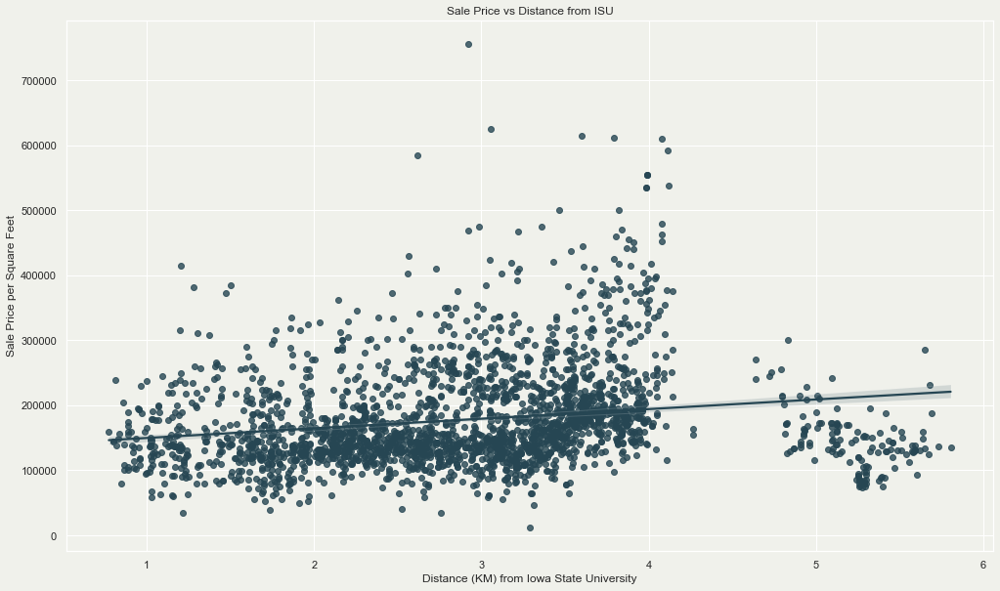

In [213]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})

colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
fig, ax1 = plt.subplots(figsize=(17,10))
sns.regplot(x = 'Distance', y = 'SalePrice', data = ames_df2)
ax1.set_title('Sale Price vs Distance from ISU', fontsize=12)
ax1.set_xlabel('Distance (KM) from Iowa State University', fontsize=12)
ax1.set_ylabel('Sale Price per Square Feet', fontsize=12)

## Distance from Iowa State University vs Sale Price


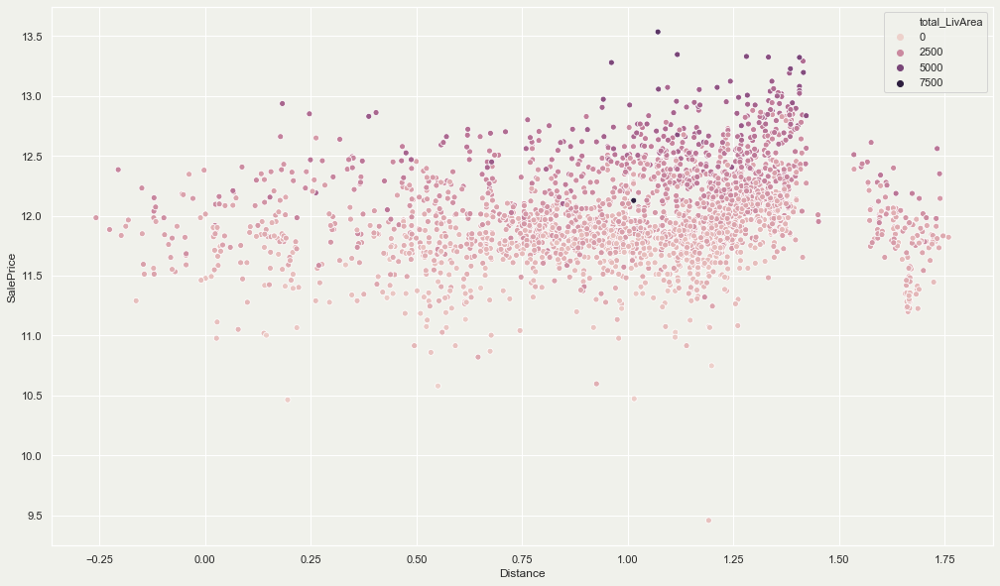

In [266]:
# Distance VS Sale Price
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
plt.figure(figsize = (17,10))
log_distance = np.log(ames_df['Distance'])
log_SalePrice= np.log(ames_df['SalePrice'])
sns.scatterplot(x = log_distance, y = log_SalePrice, hue = 'total_LivArea', data = ames_df2)

# House Size

## Sale Price vs Total Living Area

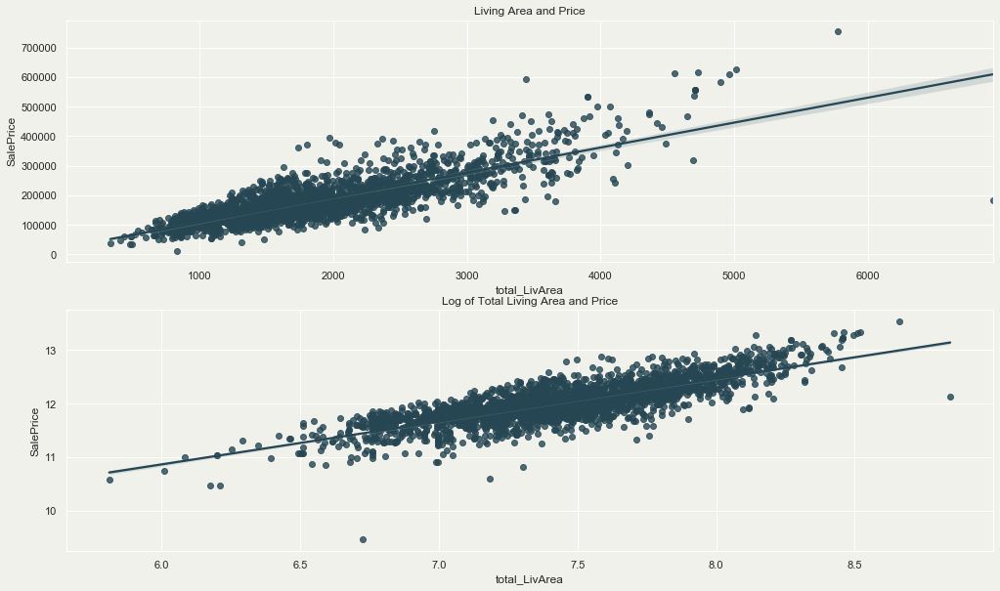

In [64]:
X = np.log(ames_df['total_LivArea']) 
Y = np.log(ames_df['SalePrice'])

plt.figure(figsize = (17,10))
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

ax1 = plt.subplot(2,1,2).set_title("Log of Total Living Area and Price")
sns.regplot(x = X, y = Y, data = ames_df)

ax2 = plt.subplot(2,1,1).set_title("Living Area and Price")
sns.regplot(x = 'total_LivArea', y = 'SalePrice', data = ames_df)

#### Larger living area leads to higher sale price; in addition, the impact of living area on sale price wanes off as the living area continues to increase.

## Living Area vs Sale Price

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/numpy/core/function_base.py:153: RuntimeWarning: invalid value encountered in multiply
  def logspace(start, stop, num=50, endpoint=True, base=10.0, dtype=None):
/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/numpy/core/function_base.py:163: RuntimeWarning: invalid value encountered in add
  start : float
/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/numpy/linalg/linalg.py:1965: RuntimeWarning: invalid value encountered in greater
  sign, logdet = _umath_linalg.slogdet(a, signature=signature)


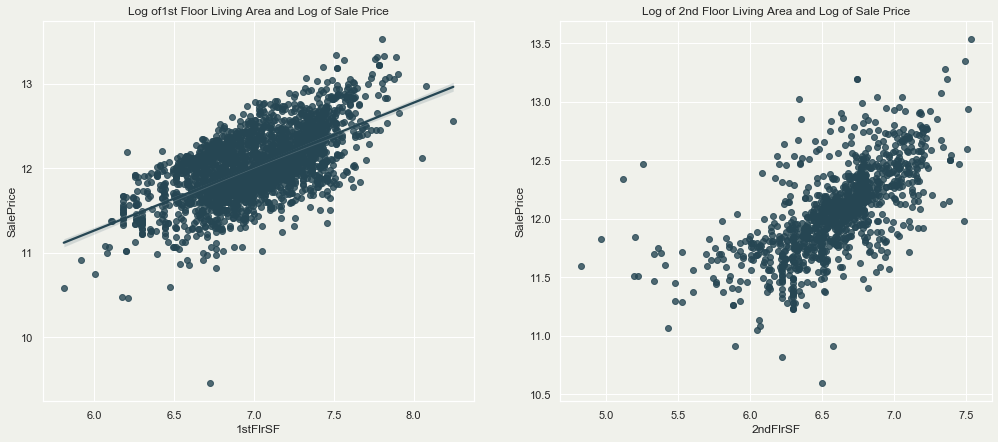

In [65]:
X = np.log(ames_df['1stFlrSF']) 
Y = np.log(ames_df['SalePrice'])

XX = np.log(ames_df['2ndFlrSF']) 
YY = np.log(ames_df['SalePrice'])

plt.figure(figsize = (17,7))
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

ax1 = plt.subplot(1,2,1).set_title("Log of1st Floor Living Area and Log of Sale Price")
sns.regplot(x = X, y = Y, data = ames_df)

ax2 = plt.subplot(1,2,2).set_title("Log of 2nd Floor Living Area and Log of Sale Price")
sns.regplot(x = XX, y = Y, data = ames_df)

# House Age

## Age Characteristics of Houses at Ames  

In [75]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()
Q1 = np.percentile(ames_df2['age_building'], 25, interpolation = 'midpoint')
Q2 = np.percentile(ames_df2['age_building'], 50, interpolation = 'midpoint')
Q3 = np.percentile(ames_df2['age_building'], 75, interpolation = 'midpoint')
IQR = Q3 - Q1

building_age_new = []
for row in ames_df2['age_building']:
    if row < 5 : building_age_new.append('New')
    elif row < 16 : building_age_new.append('Fairly New')
    elif row < 42 : building_age_new.append('Fairly Old')
    else : building_age_new.append('Old')
ames_df2['age_building_new'] = building_age_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='New')
feature_2 = folium.FeatureGroup(name='Fairly New')
feature_3 = folium.FeatureGroup(name='Fairly Old')
feature_4 = folium.FeatureGroup(name='Old')


for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['age_building_new'], v['Neighborhood'], v['age_building'])
    
    if v['age_building_new'] == 'New':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['age_building_new'] == 'Fairly New':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['age_building_new'] == 'Fairly Old':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['age_building_new'] == 'Old':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)
locs_map

In [89]:
from ames_function import feature_eng
house_df_eng = feature_eng(ames_df)
ames_df['effective_age'] = ames_df['YrSold'] - ames_df['YearRemodAdd']
ames_df['actual_age'] = ames_df['YrSold'] - ames_df['YearBuilt']

## Effective House Age vs Sale Price

(1, 62)

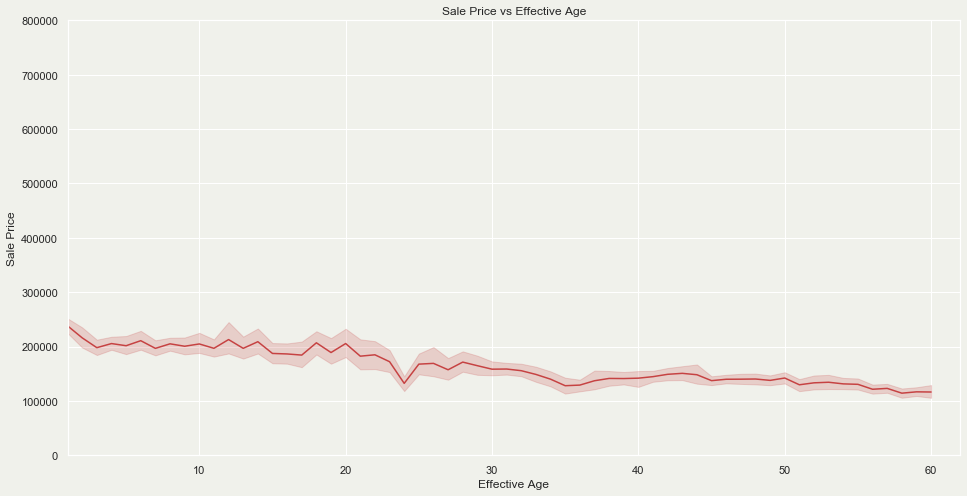

In [221]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
var = 'effective_age'
data = pd.concat([ames_df['SalePrice'], ames_df[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.lineplot(x=var, y="SalePrice", data=data, color = '#c64242')
fig.axis(ymin=0, ymax=800000)
ax.set_title('Sale Price vs Effective Age', fontsize=12)
ax.set_xlabel('Effective Age', fontsize=12)
ax.set_ylabel('Sale Price', fontsize=12)
plt.xlim(1, 62)

#### Effective house age is calculated as Year Sold - Year Remodeled. The lower the effective age, the more expensive houses are. This indicates that there is an investment opportunity for home flippers to make profit in Ames. 

## Actual Age vs Sale Price

Text(0, 0.5, 'Sale Price')

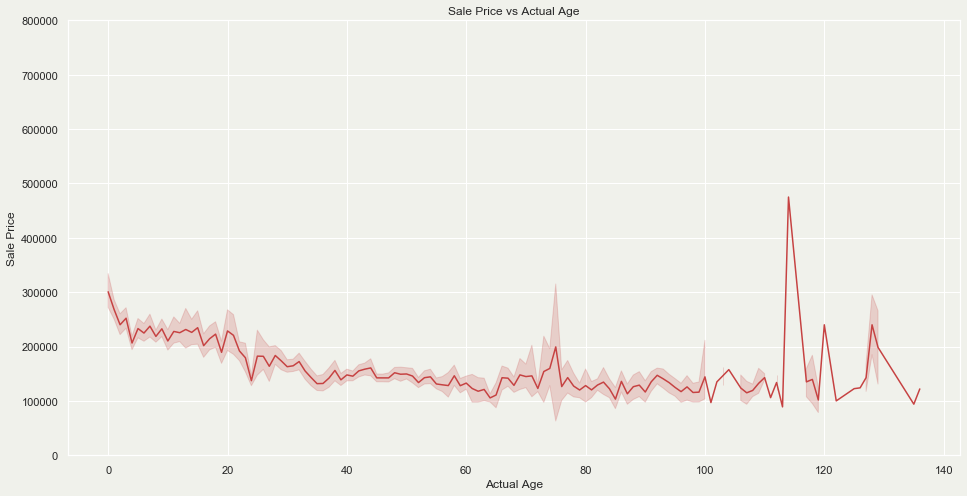

In [222]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.lineplot(x='actual_age', y="SalePrice", data=ames_df, color = '#c64242')
fig.axis(ymin=0, ymax=800000)
ax.set_title('Sale Price vs Actual Age', fontsize=12)
ax.set_xlabel('Actual Age', fontsize=12)
ax.set_ylabel('Sale Price', fontsize=12)

#### Actual age is calculated as Year Sold - Year Built. If we exclude the outlier, newer houses have a higher selling price. 

In [98]:
ames_df2['effective_age'] = ames_df2['YrSold'] - ames_df2['YearRemodAdd']
ames_df2['actual_age'] = ames_df2['YrSold'] - ames_df2['YearBuilt']
ames_df4 = ames_df2.groupby(['Neighborhood_New'])['effective_age', 'actual_age'].mean().reset_index()
ames_geo_mean_df2 = pd.merge(nbh_geo_df, ames_df4, left_on = 'Neighborhood', right_on='Neighborhood_New')
ames_geo_mean_df2

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  This is separate from the ipykernel package so we can avoid doing imports until


,Neighborhood,geometry,Neighborhood_New,effective_age,actual_age
0,City Center,"POLYGON ((-93.62326 42.06548, -93.62051 42.055...",City Center,37.134940,47.780723
1,24th St / Grand Ave,"POLYGON ((-93.62068 42.04579, -93.64017 42.045...",24th St / Grand Ave,27.483871,32.145161
2,E 13th St / Duff Ave,"POLYGON ((-93.63476 42.03450, -93.63373 42.033...",E 13th St / Duff Ave,34.746835,82.167722
3,S Duff Ave / E Lincoln Way,"POLYGON ((-93.57141 42.02896, -93.61656 42.023...",S Duff Ave / E Lincoln Way,35.134503,69.994152
4,Grand Ave / 30th St,"POLYGON ((-93.64240 42.05643, -93.63450 42.045...",Grand Ave / 30th St,10.962963,11.497942
5,Stange Rd / Pammel Ct,"POLYGON ((-93.64480 42.04540, -93.64480 42.035...",Stange Rd / Pammel Ct,20.806452,26.129032
6,Woodland St / West St,"POLYGON ((-93.65656 42.02819, -93.66840 42.028...",Woodland St / West St,33.149701,51.227545
7,Ontario,"POLYGON ((-93.69887 42.03457, -93.69905 42.022...",Ontario,24.116041,33.436860
8,Lincoln Way / 500th Ave,"POLYGON ((-93.69887 42.02245, -93.69879 42.014...",Lincoln Way / 500th Ave,9.175000,10.570833
9,Lincoln Way / State Ave,"POLYGON ((-93.65905 42.02252, -93.65888 42.007...",Lincoln Way / State Ave,39.745098,66.803922


## Average House Age by Neighborhood

In [153]:
import folium
from branca.colormap import linear


nbh_count_colormap3 = linear.YlGnBu_09.scale(min(ames_geo_mean_df2['effective_age']),
                                            max(ames_geo_mean_df2['effective_age']))

nbh_locs_map3 = folium.Map(location=[42.045042, -93.6473567],
                          zoom_start = 11.5, tiles='cartodbpositron')

style_function = lambda x: {
    'fillColor': nbh_count_colormap2(x['properties']['effective_age']),
    'color': 'black',
    'weight': 2,
    'fillOpacity': 0.7
}

folium.GeoJson(
    ames_geo_mean_df2,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood_New', 'effective_age'],
        aliases=['Neighborhood', 'Sales Price per Square Feet'],
        localize=True
    )
).add_to(nbh_locs_map3)

nbh_count_colormap3.add_to(nbh_locs_map3)
nbh_count_colormap3.caption = 'Average Effective House Age by Neighborhood'
nbh_count_colormap3.add_to(nbh_locs_map3)
folium.map.CustomPane('labels').add_to(nbh_locs_map3)
folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(nbh_locs_map3)
nbh_locs_map3

# House Features

## Basement

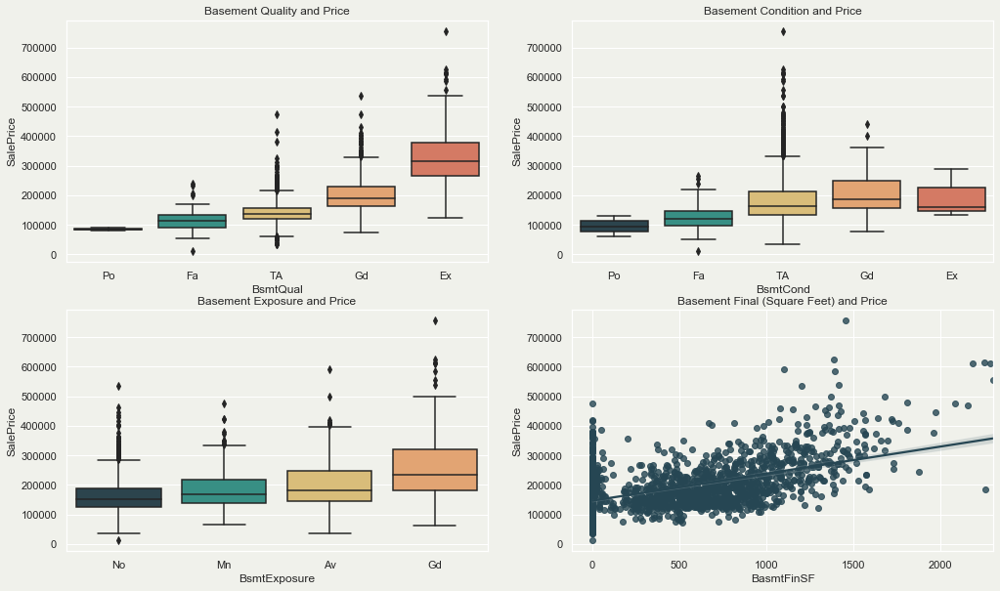

In [152]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))


plt.figure(figsize = (17,10))

plt.subplot(2,2,1).set_title("Basement Quality and Price")
sns.boxplot(x = 'BsmtQual', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = housing)

plt.subplot(2,2,2).set_title("Basement Condition and Price")
sns.boxplot(x = 'BsmtCond', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = housing)

plt.subplot(2,2,3).set_title("Basement Exposure and Price")
sns.boxplot(x = 'BsmtExposure', y = 'SalePrice', order=["No","Mn","Av","Gd"], data = housing)

plt.subplot(2,2,4).set_title("Basement Final (Square Feet) and Price")
sns.regplot(x = 'BasmtFinSF', y = 'SalePrice', data = housing)

#### Greater quality and greater size of the basement are related to higher sale price. 

## Kitchen

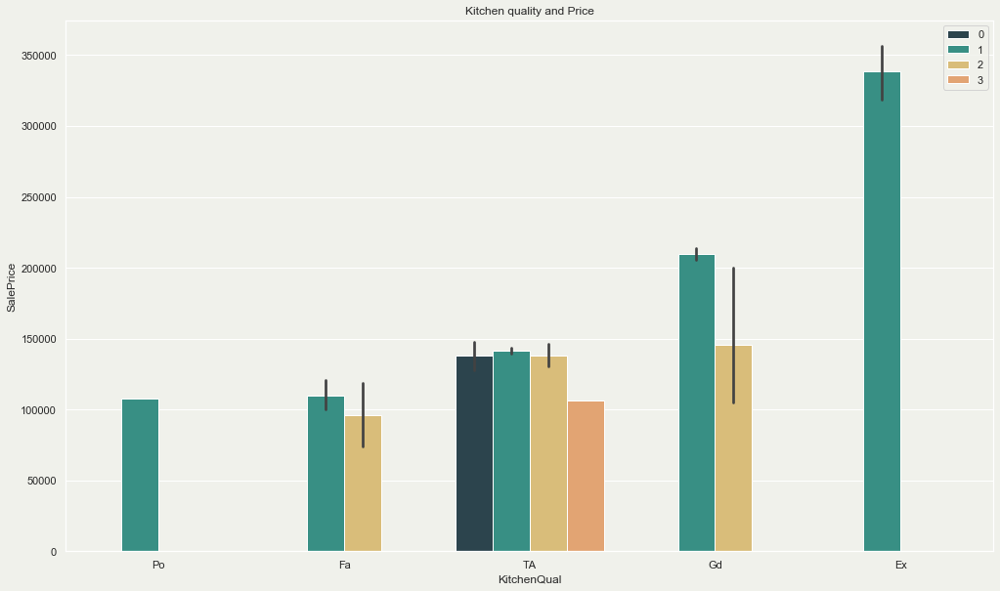

In [151]:
plt.figure(figsize = (17,10))
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
plt.title('Kitchen quality and Price')
sns.barplot(x = 'KitchenQual', y = 'SalePrice', data = ames_df, \
            order=["Po","Fa","TA","Gd", "Ex"], hue = 'KitchenAbvGr').legend(loc='upper right')


- Higher kitchen quality could increase house price
- Price has no significant difference in number of kitchen with same quality.

## Garage

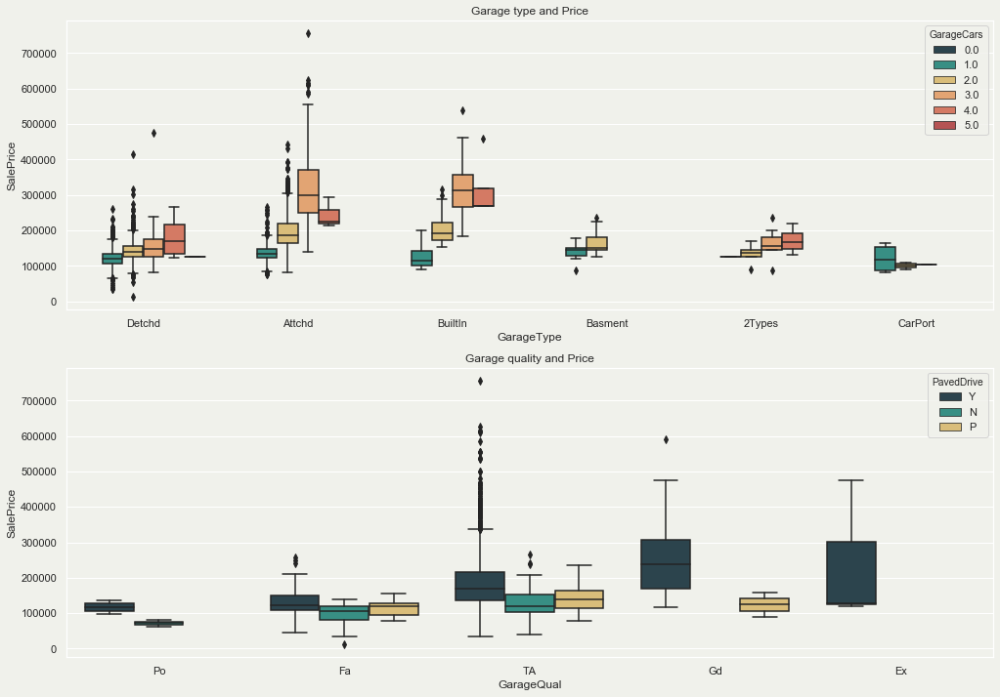

In [149]:
plt.figure(figsize = (17,12))
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

plt.subplot(2,1,1).set_title("Garage type and Price")
sns.boxplot(x = 'GarageType', y = 'SalePrice', hue = 'GarageCars',\
            data = ames_df)

plt.subplot(2,1,2).set_title("Garage quality and Price")
sns.boxplot(x = 'GarageQual', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], hue = 'PavedDrive',\
            data = ames_df)

- Garage with good and excellent quality, they do have paved drive way and higher house price
- Paved drive way has higher house price compare to no paved for the same garage quality

## Bathroom

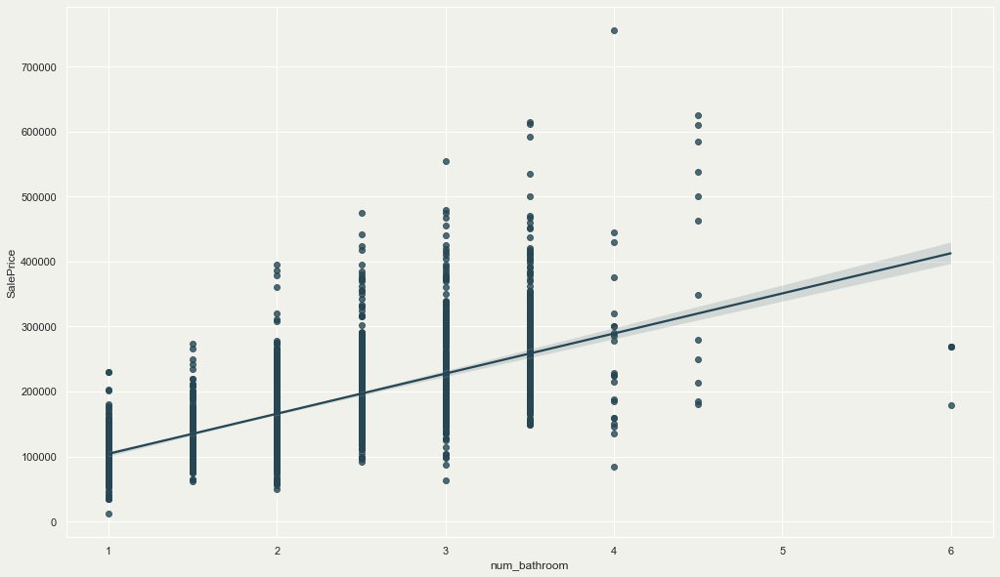

In [145]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
fig, ax1 = plt.subplots(figsize=(17,10))
sns.regplot(x = 'num_bathroom', y = 'SalePrice', color = '#264653', data = housing)

#### The graph shows that there is a relationship between number of bathrooms and sale price

# Other Interior Features:

## Electricity, Heating, Central Air, and Fireplace

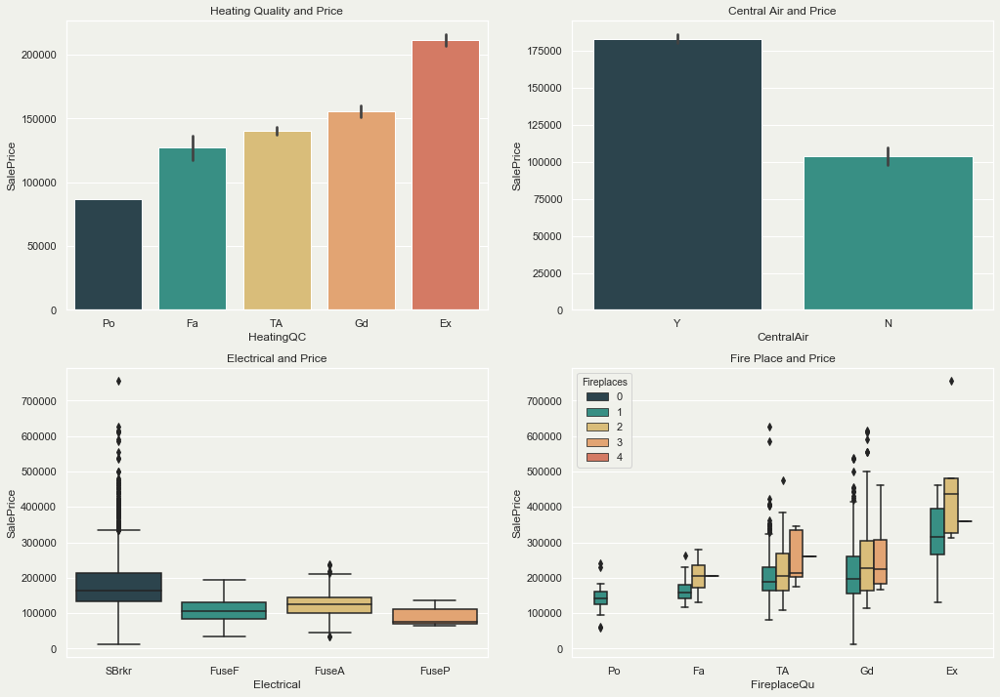

In [170]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51"]
sns.set_palette(sns.color_palette(colors))

plt.figure(figsize = (17,12))

plt.subplot(2,2,1).set_title("Heating Quality and Price")
sns.barplot(x = 'HeatingQC', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = ames_df)

plt.subplot(2,2,2).set_title("Central Air and Price")
sns.barplot(x = 'CentralAir', y = 'SalePrice', data = housing)

plt.subplot(2,2,3).set_title("Electrical and Price")
sns.boxplot(x = 'Electrical', y = 'SalePrice', data = housing)

plt.subplot(2,2,4).set_title("Fire Place and Price")
sns.boxplot(x = 'FireplaceQu', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], hue = 'Fireplaces',\
            data = ames_df)

- Having better heating quality is related to higher sale price
- Having central air is related to higher sale price
- Having more and having better quality of fire place is related to higher sale price

# Other Exterior Features

 ### Land Slope, Building Type, Porch, Roof Style

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


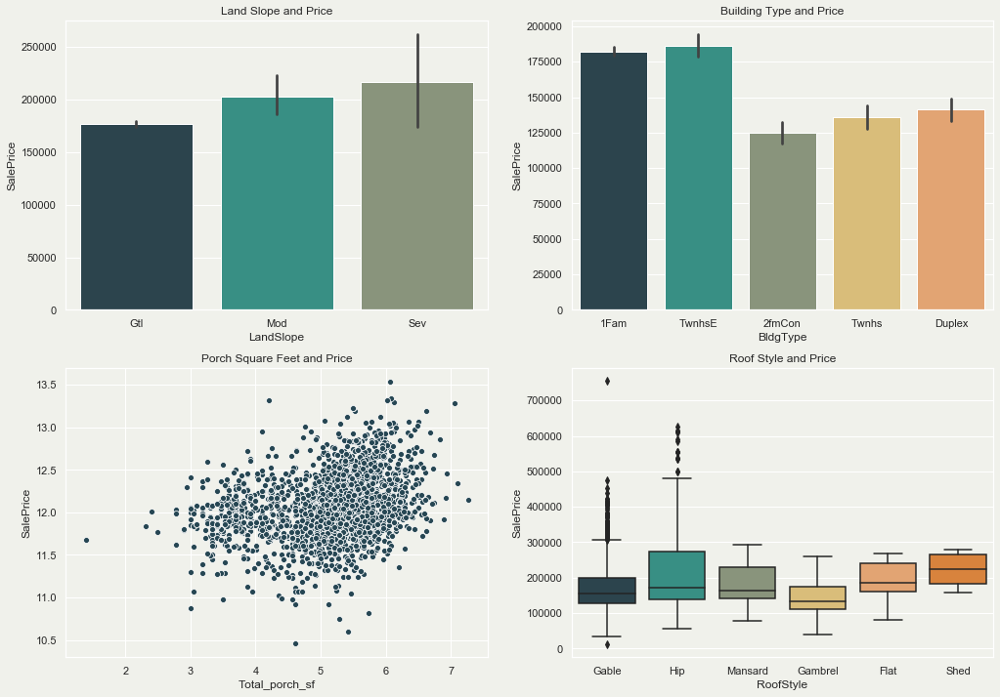

In [224]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#899878","#e9c46a", "#f4a261", "#F28123", "#e76f51","#563F1B"]
sns.set_palette(sns.color_palette(colors))


log_porch = np.log(ames_df['Total_porch_sf'])
log_SalePrice= np.log(ames_df['SalePrice'])

plt.figure(figsize = (17,10))



plt.subplot(2,2,1).set_title("Land Slope and Price")
sns.barplot(x = 'LandSlope', y = 'SalePrice', data = ames_df)

plt.subplot(2,2,2).set_title("Building Type and Price")
sns.barplot(x = 'BldgType', y = 'SalePrice', data = ames_df)

plt.subplot(2,2,3).set_title("Porch Square Feet and Price")
sns.scatterplot(x = log_porch, y = log_SalePrice, data = ames_df)

plt.subplot(2,2,4).set_title("Roof Style and Price")
sns.boxplot(x = 'RoofStyle', y = 'SalePrice', data = ames_df)

- Houses that are on the steeper hill seem to be more expensive
- End-unit town houses seem to be significantly more expensive than in-unit town houses
- Duplexes are more expensive than 2 family conversion
- Houses with a shed roof style are associated with higher median sale price
- Houses with greater porch area is associated with higher sale price

# Masonry Veneer, Foundation, Exterior Condition and Quality

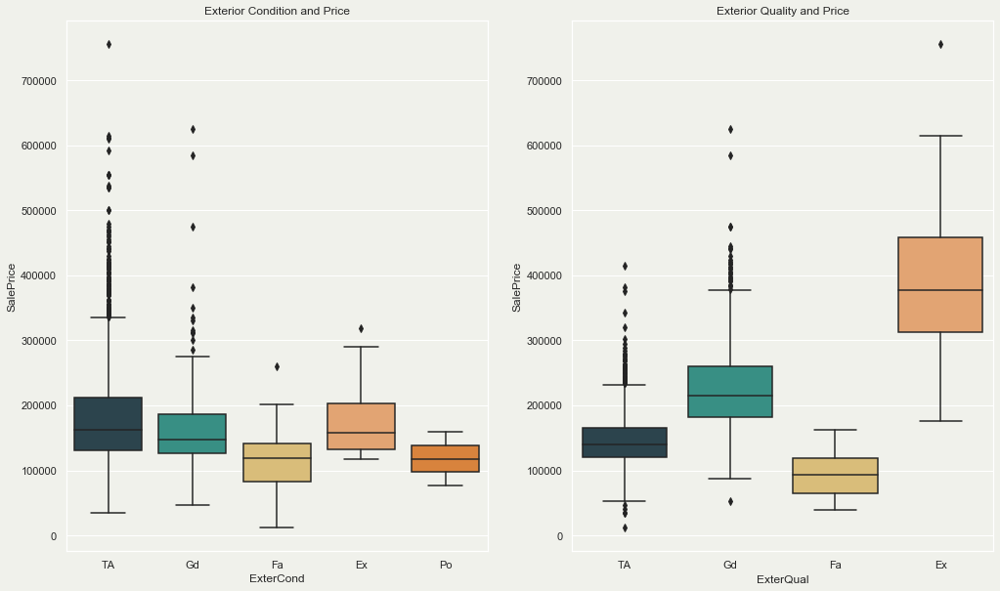

In [67]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#F28123", "#e76f51","#563F1B"]
sns.set_palette(sns.color_palette(colors))

plt.figure(figsize = (17,10))

plt.subplot(1,2,1).set_title("Exterior Condition and Price")
sns.boxplot(x = 'ExterCond', y = 'SalePrice', data = ames_df)

plt.subplot(1,2,2).set_title("Exterior Quality and Price")
sns.boxplot(x = 'ExterQual', y = 'SalePrice', data = ames_df)

In [5]:
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV, HuberRegressor
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict,cross_validate, GridSearchCV, train_test_split
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor 
import statistics
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
ames_df = pd.read_csv('./data/final_df.csv', index_col = 0)

# Checking final_df after generating geoCode, found duplicated observations
ames_df.shape

(2603, 179)

In [7]:
# drop duplicated observations
ames_df = ames_df.drop_duplicates(subset=['PID'],keep = 'first')
ames_df.shape

(2558, 179)

In [8]:
ames_df_use = ames_df.copy()

# convert MSSubClass to str
ames_df_use['MSSubClass'] = ames_df_use[['MSSubClass']].astype('str')

# characterize tax distr and sch distr
ames_df_use['TxD_S'] = ames_df_use[['TxD_S']].astype('str')
ames_df_use['SchD_S'] = ames_df_use[['SchD_S']].astype('str')

# convert NA's to 0s in LotFrontage and Alley
ames_df_use['LotFrontage'] = np.where(pd.isnull(ames_df_use['LotFrontage']), 0, ames_df_use['LotFrontage'])
ames_df_use['Alley'] = np.where(pd.isnull(ames_df_use['Alley']), 0, 1)

# impute None to Nan value in columns
none_features = ['FireplaceQu','GarageType','GarageFinish','GarageQual','GarageCond','Fence','BsmtQual','BsmtCond']
for feature in none_features:
    ames_df_use[feature] = ames_df_use[feature].fillna('None')

# impute None to 0 values in columns
zero_features = ['1stFlrSF','2ndFlrSF','GarageCars','TtlBsmtSF','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','GarageArea',
                 'BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','Fireplaces']
for feature in zero_features:
    ames_df_use[feature] = ames_df_use[feature].fillna(0)

# drop rows with NA garage car / garage area
garage_NA_index = ames_df_use.loc[pd.isnull(ames_df_use['GarageArea'])].index
ames_df_use = ames_df_use.drop(garage_NA_index,axis=0)

# add in proper bathroom numbers for 918 and 2328
ames_df_use.at[918, 'num_bathroom'] = 1
ames_df_use.at[2328, 'num_bathroom'] = 3.5

In [9]:
X_full = ames_df_use[['YearBuilt','GrLivArea','OverallQual','OverallCond','TtlBsmtSF','BsmtUnfSF',\
                      'GarageArea','GarageQual','KitchenAbvGr','KitchenQual','BedroomAbvGr','FullBath',\
                      'Fireplaces','FireplaceQu','Neighborhood','MSSubClass','TxD_S']]

# X_full['1stFlrSF'] = np.log(X_full['1stFlrSF']+1)
# X_full['2ndFlrSF'] = np.log(X_full['2ndFlrSF']+1)
X_full['GrLivArea'] = np.log(X_full['GrLivArea'])
X_full['TtlBsmtSF'] = np.log(X_full['TtlBsmtSF']+1)
# X_full['BsmtFinSF1'] = np.log(X_full['BsmtFinSF1']+1)
# X_full['BsmtFinSF2'] = np.log(X_full['BsmtFinSF2']+1)
X_full['GarageArea'] = np.log(X_full['GarageArea']+1)

X_full_dum = pd.get_dummies(X_full, drop_first = True)
print(X_full_dum.shape)

y_full = np.log(ames_df_use['SalePrice'])

(2558, 66)


/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See

In [10]:
lin_reg = LinearRegression(normalize = True).fit(X_full_dum, y_full)
lin_reg.score(X_full_dum, y_full)

x_feature = sm.add_constant(X_full_dum)

model = sm.OLS(y_full, x_feature)
results_feature = model.fit()
print(results_feature.summary())
pValue = results_feature.pvalues
pValue[pValue<0.05]

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.914
Method:                 Least Squares   F-statistic:                     418.8
Date:                Mon, 30 Nov 2020   Prob (F-statistic):               0.00
Time:                        22:15:42   Log-Likelihood:                 1987.4
No. Observations:                2558   AIC:                            -3843.
Df Residuals:                    2492   BIC:                            -3457.
Df Model:                          65                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.6695 

YearBuilt                1.640017e-44
GrLivArea               9.338704e-226
OverallQual              1.015881e-65
OverallCond              4.982948e-97
TtlBsmtSF                4.125374e-52
BsmtUnfSF                1.665407e-31
GarageArea               9.468491e-18
KitchenAbvGr             6.422256e-06
BedroomAbvGr             1.567246e-05
Fireplaces               1.468775e-07
GarageQual_Fa            1.406765e-02
GarageQual_None          2.369733e-02
GarageQual_Po            1.419613e-03
GarageQual_TA            1.893787e-02
KitchenQual_Fa           2.844699e-09
KitchenQual_Gd           4.986836e-14
KitchenQual_TA           1.264190e-17
FireplaceQu_TA           2.016512e-02
Neighborhood_ClearCr     2.729804e-05
Neighborhood_Crawfor     3.119073e-07
Neighborhood_Greens      1.994292e-02
Neighborhood_IDOTRR      6.533642e-04
Neighborhood_MeadowV     1.957688e-02
Neighborhood_NoRidge     3.489850e-10
Neighborhood_NridgHt     1.815439e-04
Neighborhood_OldTown     2.725094e-03
Neighborhood

# Feature Engineering

- Building Age: Year Sold - Year Built
- Remodeled: 1 if remodeled, 0 if not
- IsPUD: 1 if PUD, 0 if not
- PosFeat: 1 if near/adjacent to positive feature, 0 if not
- Extmatl: exterior material 1 + 2
- TotalPorchSF: all porch sf
- HasFence: 1 if has fence, 0 if not
- Funct_3: normal, minor, moderate to severe
- num_bathroom: all bathrooms
- BsmtTtlFinSF: FinSF1+2
- Qual/Cond: Quantified quality/condition
- Direction: direction relative to ISU

In [11]:
# remove unnecessary columns
ames_df_use = ames_df_use.drop(
    ['PA-PreD','PA-PostD','PA-UnTyp','PA-UntNo','X1TPr_D','X1TSc_D','Rcrd_Mo','Legal_Pr','SchD_S',\
    'X2TPr_D','X2TSc_D','X1TPr_S','X1TSc_S','X2TPr_S','X2TSc_S','ISU_lat_long','address','MA_Ownr1','MA_Ownr2',\
    'MA_Line1','MA_Line2','MA_City','MA_State','address3','location2','point2','SaleCond','Source','Date',\
    'ParType','BldgNo_S','DwlgNo_S','YrBuilt','Ext1','Ext2','GLA','GarYrBlt','Cars','MA_Zip1','MA_Zip2',\
    'ZngCdPr','ZngCdSc','ZngOLPr','ZngOLSc','PA-Nmbr','PA-Strt','PA-StSfx','Inst1_No','Inst1_Yr','Inst1_Mo',\
    'Inst1TPr','TtlVal_AsrYr','ValType','OthAc_S','ImpAc_S','LndAc_S','Prop_Addr','HSTtl_D','MilVal_D',\
    'HSTtl_S','MilVal_S','GeoRefNo','Tier','Range','AcreX_S1','ClassPr_S','ClassSc_S','LndAcX1S','ImpAcX1S',\
    'Central Air','ImpAcX2S','AcreGr','AcreNt_S','ParclRel','Rcrd_Yr','address2','SaleType',\
    'latitude2','longitude2','ISU_lat','ISU_long','altitude2','Central Air',\

    'index','MiscVal','YrSold_YYYY','MoSold_MM','PoolArea','PoolQC','MiscFeature','Street','PID','Utilities',\
    'BsmtHalfBath2','FullBath','HalfBath','TtlBsmtSF','HalfBath2','BsmtFullBath','BsmtHalfBath',\
    'BsmtFinType1','BsmtFinType2','LowQualFinSF',\
    '1stFlrSF','2ndFlrSF','MasVnrType','MasVnrArea','GarageArea2','PoolArea2','NmbrBRs',\
    'TotalBsmtSF','GarageYrBlt','BasmtFinSF','Heating'],\
    axis=1)

print(ames_df_use.columns)
print(f'has null: {ames_df_use.columns[ames_df_use.isnull().sum() > 0]}')

Index(['GrLivArea', 'SalePrice', 'Distance', 'MSSubClass', 'MSZoning',
       'LotFrontage', 'LotArea', 'Alley', 'LotShape', 'LandContour',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'HeatingQC',
       'CentralAir', 'Electrical', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageCars', 'GarageArea',
       'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'Fence', 'MoSold',
       'YrSold', 'SaleCondition', 'MasVnrArea2', 'BasmtFinSF1', 'BasmtFinSF2',
       'total_LivArea', 'num_bathroom', 

In [12]:
def feature_eng(df):
    # num_bathroom = adding up all the bathroom variables
    
    # calculate age of building
    df['BldgAge'] = df['YrSold'] - df['YearBuilt']
    #effectiveage: df['BldgAge'] = df['YearBuilt'] - df['YearRemodAdd']
    
    # adding up BsmtFinSF 1 and 2
    df['BsmtTtlFinSF'] = df['BsmtFinSF1'] + df['BsmtFinSF2']
    
    # binarize YearRemodAdd
    df['Remodeled'] = np.where(df['YearRemodAdd'] == df['YearBuilt'], 0, 1)

    # binarize MSSubClass to PUD or not PUD
    df['IsPUD'] = np.where(df['MSSubClass'].isin(['120','150','160','180']), 1, 0)
    
    # binarize Condition1/2 to positive feature or no positive feature
    df['PosFeat'] = np.where(df['Condition1'].isin(['PosN','PosA'])|df['Condition2'].isin(['PosN','PosA']), 1, 0)
    
    # combine exterior material 1/2 to one column
    df['ExtMatl'] = np.where((df['Exterior1st']==df['Exterior2nd']),df['Exterior1st'], 'Mixed')
    
    # simply qual/cond features
    for col in ['ExterQual','BsmtQual','KitchenQual','FireplaceQu','GarageQual','ExterCond',\
                'BsmtCond','GarageCond','HeatingQC']:
        df[col+'_num'] = df[col].replace(['Ex','Gd','TA','Fa','Po','None'],[10,8,6,4,2,0])

    # sum up porch/housefront area
    df['TotalPorchSF'] = df['OpenPorchSF'] + df['3SsnPorch'] + df['EnclosedPorch'] +\
                                df['ScreenPorch'] + df['WoodDeckSF']
    
    # binarize fences to having a fence or not having a fence
    df['HasFence'] = np.where(df['Fence']=='None', 0, 1)

    # simplify Functional to 3 classes
    df['Funct_3'] = df['Functional'].replace(['Maj1', 'Maj2', 'Min1', 'Min2', 'Mod', 'Sal', 'Typ'],\
                                             ['ModToSev','ModToSev','Minor','Minor','ModToSev','ModToSev','Normal'])
    
    # assign a direction for each neighborhood
    df['Direction'] = df['Neighborhood'].replace(['Blmngtn','Blueste','BrDale','BrkSide','ClearCr','CollgCr','Crawfor',\
                                                  'Edwards','Gilbert','Greens','IDOTRR','MeadowV','Mitchel','NAmes',\
                                                  'NPkVill','NWAmes','NoRidge','NridgHt','OldTown','SWISU','Sawyer',\
                                                  'SawyerW','Somerst','StoneBr','Timber','Veenker'],\
                                                 ['N','S','N','E','N','W','S','W','N','S','W','S','S','N','N','N','N',\
                                                 'N','E','S','W','W','N','N','S','N'])
    
    # drop the original columns or unused columns
    df = df.drop(['MSSubClass','YearBuilt','YearRemodAdd','LotFrontage','LotArea','LotConfig','LandSlope',\
                  'Condition1','Condition2','Exterior1st','Exterior2nd','LotShape','LandContour',\
                  'OpenPorchSF','3SsnPorch','EnclosedPorch','ScreenPorch','WoodDeckSF',\
                  'Fence','Functional','ExterQual','BsmtQual','KitchenQual','FireplaceQu',\
                  'GarageQual','ExterCond','BsmtCond','GarageCond','HeatingQC','MSZoning',\
                  'GarageCars','RoofStyle','RoofMatl','KitchenAbvGr','Functional','Neighborhood',\
                  'BsmtFinSF1', 'BsmtFinSF2','BasmtFinSF1', 'BasmtFinSF2','BedroomAbvGr',\
                 'total_LivArea','Alley','MoSold','YrSold'],\
                 axis = 1)
    return df

In [13]:
ames_df_eng = feature_eng(ames_df_use)

In [14]:
# dummify the dataset
ames_df_dum = pd.get_dummies(ames_df_eng, drop_first=True)
print(ames_df_dum.shape)
print(ames_df_dum.shape)

# apply log()
ames_df_dum['SalePrice'] = np.log(ames_df_dum['SalePrice'])
ames_df_dum['GrLivArea'] = np.log(ames_df_dum['GrLivArea'])
ames_df_dum['BsmtUnfSF'] = np.log(ames_df_dum['BsmtUnfSF']+1)
ames_df_dum['BsmtTtlFinSF'] = np.log(ames_df_dum['BsmtTtlFinSF']+1)
# ames_df_dum['total_LivArea'] = np.log(ames_df_dum['total_LivArea'])
# ames_df_dum['Distance'] = np.log(X_train_dum['Distance'])
ames_df_dum['TotalPorchSF'] = np.log(ames_df_dum['TotalPorchSF']+1)

(2558, 84)
(2558, 84)


In [15]:
features = ames_df_dum.drop('SalePrice', axis = 1)
target = ames_df_dum['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2046, 83)
(512, 83)
(2046,)
(512,)


In [16]:
lin_reg = LinearRegression().fit(X_train, y_train)
lin_reg.score(X_train, y_train)

x_feature = sm.add_constant(X_train)

model = sm.OLS(y_train, x_feature)
results_feature = model.fit()
print(results_feature.summary())
pValue = results_feature.pvalues
pValue[pValue<0.05]

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.918
Model:                            OLS   Adj. R-squared:                  0.914
Method:                 Least Squares   F-statistic:                     264.4
Date:                Mon, 30 Nov 2020   Prob (F-statistic):               0.00
Time:                        22:15:54   Log-Likelihood:                 1597.5
No. Observations:                2046   AIC:                            -3027.
Df Residuals:                    1962   BIC:                            -2555.
Df Model:                          83                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     6.80

const                    2.462976e-314
GrLivArea                2.884828e-123
Distance                  1.182114e-08
OverallQual               7.140801e-48
OverallCond               6.317981e-54
Fireplaces                7.215780e-06
GarageArea                6.306146e-19
num_bathroom              8.778399e-07
BldgAge                   1.031875e-21
BsmtTtlFinSF              2.536005e-14
Remodeled                 1.203612e-02
ExterQual_num             6.120762e-03
BsmtQual_num              6.259563e-08
KitchenQual_num           2.949583e-06
HeatingQC_num             1.809183e-06
BldgType_2fmCon           4.481889e-04
BldgType_Duplex           2.741928e-12
BldgType_Twnhs            1.728656e-02
HouseStyle_1.5Unf         5.177088e-04
HouseStyle_1Story         2.825259e-10
HouseStyle_2Story         3.138073e-03
HouseStyle_SFoyer         2.550881e-03
BsmtExposure_Gd           3.554490e-05
BsmtExposure_Mn           7.783567e-05
BsmtExposure_No           1.609413e-08
SaleCondition_Normal     

In [17]:
print(f'Num of features: {len(X_train.columns)}')
print(f'AIC: {results_feature.aic}')
print(f'BIC: {results_feature.bic}')
print(f'train score: {lin_reg.score(X_train, y_train)}')
print(f'test score: {lin_reg.score(X_test, y_test)}')

Num of features: 83
AIC: -3027.004474737296
BIC: -2554.6185512303236
train score: 0.9179424880400754
test score: 0.9167694766634777


In [18]:
sig_feat = pValue[pValue<0.05].index.drop('const')

In [19]:
X_train2 = X_train[sig_feat]
X_test2 = X_test[sig_feat]

In [20]:
lin_reg = LinearRegression().fit(X_train2, y_train)
lin_reg.score(X_train2, y_train)

x_feature = sm.add_constant(X_train2)
model = sm.OLS(y_train, x_feature)
results_feature = model.fit()
print(results_feature.summary())
pValue = results_feature.pvalues
pValue[pValue<0.05]

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.911
Method:                 Least Squares   F-statistic:                     534.5
Date:                Mon, 30 Nov 2020   Prob (F-statistic):               0.00
Time:                        22:16:00   Log-Likelihood:                 1528.4
No. Observations:                2046   AIC:                            -2977.
Df Residuals:                    2006   BIC:                            -2752.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     6.67

const                     0.000000e+00
GrLivArea                7.017892e-219
Distance                  1.970611e-07
OverallQual               3.303162e-48
OverallCond               9.051964e-71
Fireplaces                7.397994e-10
GarageArea                2.093807e-31
num_bathroom              3.442534e-07
BldgAge                   8.449436e-31
BsmtTtlFinSF              2.502865e-19
Remodeled                 2.222188e-02
BsmtQual_num              5.205423e-13
KitchenQual_num           2.841458e-06
HeatingQC_num             4.106493e-07
BldgType_2fmCon           4.385132e-04
BldgType_Duplex           1.397871e-13
BldgType_Twnhs            3.547640e-21
HouseStyle_1.5Unf         1.538296e-04
HouseStyle_1Story         1.747252e-16
HouseStyle_2Story         5.923940e-04
HouseStyle_SFoyer         7.560822e-04
BsmtExposure_Gd           1.721928e-04
BsmtExposure_Mn           3.620121e-05
BsmtExposure_No           1.868484e-09
SaleCondition_Normal      4.590657e-14
SaleCondition_Partial    

In [21]:
print(f'Num of features: {len(X_train2.columns)}')
print(f'AIC: {results_feature.aic}')
print(f'BIC: {results_feature.bic}')
print(f'train score: {lin_reg.score(X_train2, y_train)}')
print(f'test score: {lin_reg.score(X_test2, y_test)}')

Num of features: 39
AIC: -2976.8124156826525
BIC: -2751.86673782219
train score: 0.9122086551604192
test score: 0.9141786180201619


#### Decision Tree

R^2 of Train set: 0.9267651704618162
R^2 Test set: 0.8272729389413678
          feature  importance
0   b'OverallQua'    0.569461
1   b'GarageArea'    0.123688
2    b'GrLivArea'    0.101136
3   b'num_bathro'    0.060089
4   b'BsmtTtlFin'    0.037652
5   b'KitchenQua'    0.017536
6      b'BldgAge'    0.016888
7   b'OverallCon'    0.014776
8   b'BsmtQual_n'    0.007954
9   b'FireplaceQ'    0.007436
10    b'Distance'    0.006603
11  b'Fireplaces'    0.004912
12   b'BsmtUnfSF'    0.004909
13  b'TotalPorch'    0.003634
14  b'Funct_3_Mo'    0.002777
15  b'GarageType'    0.002552
16  b'CentralAir'    0.002467
17  b'Direction_'    0.001611
18  b'HouseStyle'    0.001346
19  b'GarageFini'    0.001327


Text(0.5, 1.0, 'Feature Importance Plot of Decision Tree')

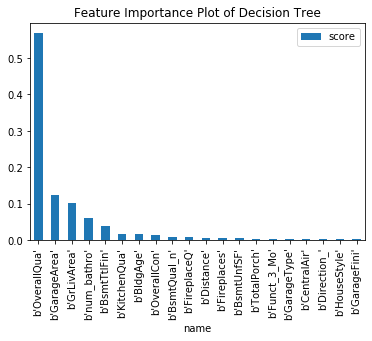

In [25]:
# Decision Tree Model
tree_reg = DecisionTreeRegressor(max_depth=8).fit(X_train,y_train)
print(f'R^2 of Train set: {tree_reg.score(X_train,y_train)}')
print(f'R^2 Test set: {tree_reg.score(X_test,y_test)}')
feature_importance_tree = list(zip(X_train.columns ,tree_reg.feature_importances_))
dtype = [('feature', 'S10'), ('importance', 'float')]
feature_importance_tree = np.array(feature_importance_tree, dtype=dtype)
feature_sort_tree = np.sort(feature_importance_tree, order = 'importance')[::-1]
name, score = zip(*list(feature_sort_tree))
print(pd.DataFrame(feature_sort_tree[:20]))
pd.DataFrame({'name':name,'score':score})[:20].plot.bar(x='name', y='score')
plt.title('Feature Importance Plot of Decision Tree')

In [28]:
from sklearn.model_selection import GridSearchCV
grid_para_tree = [{
    "criterion": ['mse'],
    "min_samples_leaf": range(1, 10),
    "min_samples_split": np.linspace(start=2, stop=30, num=15, dtype=int)
}]
tree_reg.set_params(random_state=42)
grid_search_tree = GridSearchCV(tree_reg, grid_para_tree, cv=10, scoring='r2', n_jobs=-1)
grid_search_tree.fit(X_train, y_train)
print(f'Grid Search Best Parameters: {grid_search_tree.best_params_}')
# print(f'Grid Search Best Scores: {grid_search_tree.best_score_}')
print(f'Grid Search R2 of Train set: {grid_search_tree.score(X_train,y_train)}')
print(f'Grid Search R2 of Test set: {grid_search_tree.score(X_test,y_test)}')

Grid Search Best Parameters: {'criterion': 'mse', 'min_samples_leaf': 7, 'min_samples_split': 16}
Grid Search R2 of Train set: 0.8907448098940737
Grid Search R2 of Test set: 0.8274644158781019


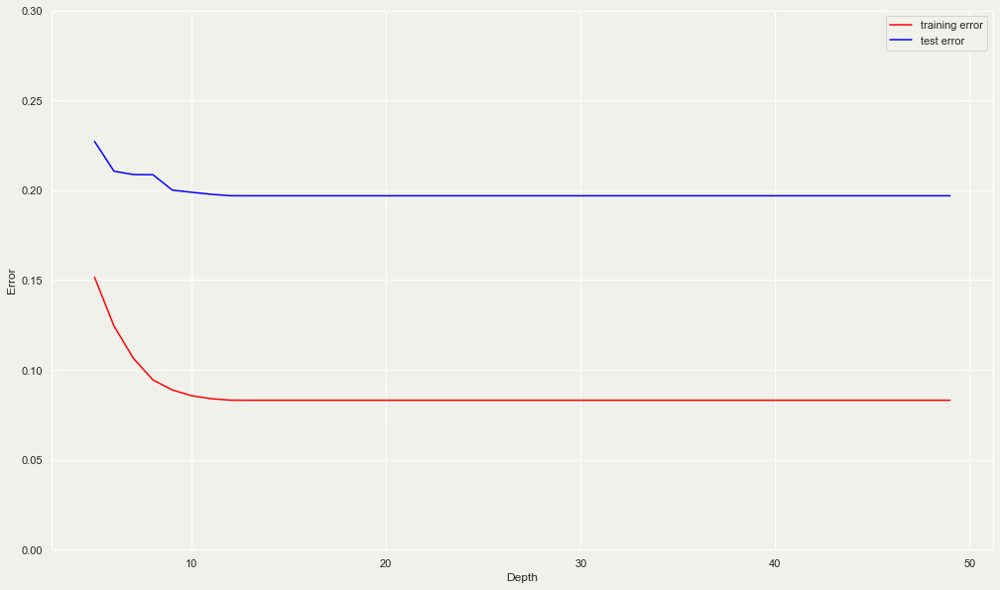

In [271]:
depth = range(5, 50)
train_error = []
test_error = []
for i in depth:
    tree_reg.set_params(max_depth=i, min_samples_leaf=9)
    tree_reg.fit(X_train, y_train)
    train_error.append(1 - tree_reg.score(X_train, y_train))
    test_error.append(1 - tree_reg.score(X_test, y_test))

plt.figure(figsize = (17,10))
plt.plot(depth, train_error, c='red', label='training error')
plt.plot(depth, test_error, c='blue', label='test error')
plt.ylim(0, 0.30)
plt.ylabel('Error')
plt.xlabel('Depth')
plt.legend()
plt.show()

### Random Forest Model

R^2 of Train set: 0.982175063308391
R^2 Test set: 0.8992938624283038
          feature  importance
0    b'GrLivArea'    0.093169
1   b'OverallQua'    0.083183
2   b'GarageArea'    0.081483
3   b'KitchenQua'    0.069043
4   b'num_bathro'    0.061582
5   b'BsmtQual_n'    0.059492
6      b'BldgAge'    0.046318
7   b'Fireplaces'    0.038798
8   b'TotRmsAbvG'    0.037446
9   b'ExterQual_'    0.035769
10  b'BsmtTtlFin'    0.034094
11  b'FireplaceQ'    0.030502
12  b'HeatingQC_'    0.023128
13    b'Distance'    0.019299
14  b'TotalPorch'    0.019288
15   b'BsmtUnfSF'    0.017148
16  b'OverallCon'    0.016820
17  b'GarageType'    0.016352
18  b'GarageFini'    0.015519
19  b'GarageQual'    0.012379


/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


CPU times: user 33.5 s, sys: 2.66 s, total: 36.2 s
Wall time: 11min 38s
Grid Search Best Parameters: {'criterion': 'mse', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1000, 'random_state': 42}
Grid Search R2 of Train set: 0.9831764784938509
Grid Search R2 of Test set: 0.9007903705814082


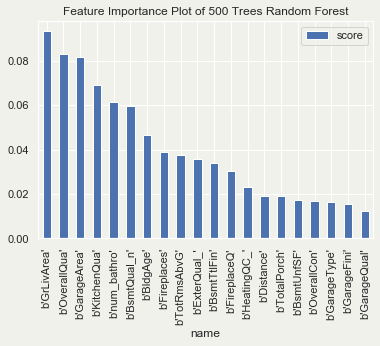

In [47]:
# Random Forest Model
forest_reg = RandomForestRegressor(n_estimators=100,max_features=5).fit(X_train,y_train)
print(f'R^2 of Train set: {forest_reg.score(X_train,y_train)}')
print(f'R^2 Test set: {forest_reg.score(X_test,y_test)}')


feature_importance_forest = list(zip(X_train.columns, forest_reg.feature_importances_))
feature_importance_forest = np.array(feature_importance_forest, dtype=dtype)
feature_sort_forest = np.sort(feature_importance_forest, order='importance')[::-1]
name, score = zip(*list(feature_sort_forest))
print(pd.DataFrame(feature_sort_forest[:20]))
pd.DataFrame({'name':name,'score':score})[:20].plot.bar(x='name', y='score')
plt.title('Feature Importance Plot of 500 Trees Random Forest')


grid_para_forest = [{
    "n_estimators": [100,500,1000],
    "criterion": ["mse"],
    "min_samples_leaf": range(1, 10),
    "min_samples_split": np.linspace(start=2, stop=30, num=15, dtype=int),
    "random_state": [42]}]
grid_search_forest = GridSearchCV(forest_reg, grid_para_forest, cv=10, scoring='r2', n_jobs=-1)
%time grid_search_forest.fit(X_train, y_train)

print(f'Grid Search Best Parameters: {grid_search_forest.best_params_}')

# print(f'Grid Search Best Scores: {grid_search_forest.best_score_}')

print(f'Grid Search R2 of Train set: {grid_search_forest.score(X_train,y_train)}')
print(f'Grid Search R2 of Test set: {grid_search_forest.score(X_test,y_test)}')

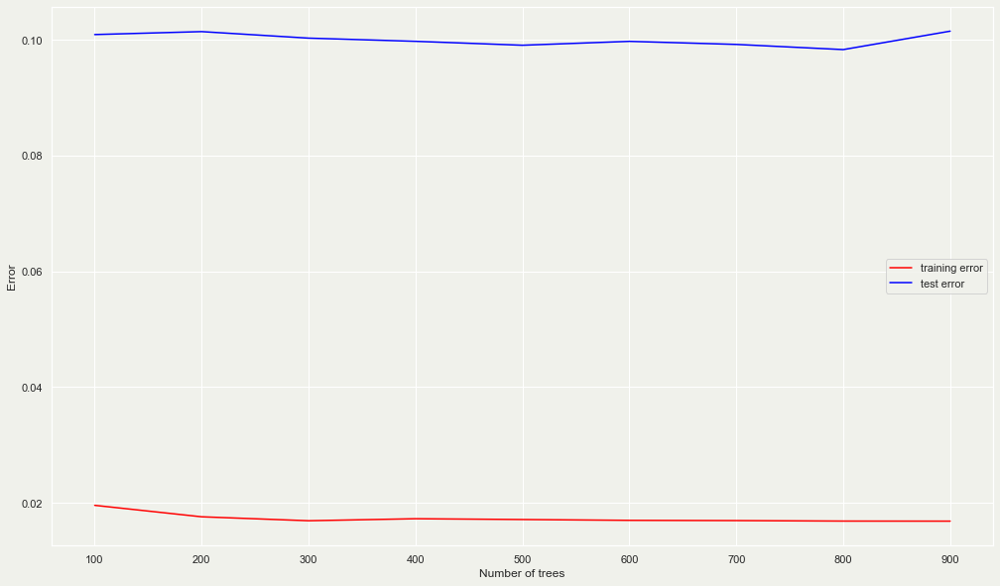

In [49]:
n_trees_range = range(100, 1000, 100)  # OOB score will warning if too few trees
train_error2 = []
test_error2 = []


for n_trees in n_trees_range:
    forest_reg.set_params(n_estimators=n_trees)
    forest_reg.fit(X_train, y_train)
    train_error2.append(1 - forest_reg.score(X_train, y_train))
    test_error2.append(1 - forest_reg.score(X_test, y_test))
    
plt.figure(figsize = (17,10))
plt.plot(n_trees_range, train_error2, c='red', label='training error')
plt.plot(n_trees_range, test_error2, c='blue', label='test error')
plt.ylabel('Error')
plt.xlabel('Number of trees')
plt.legend()
plt.show()

###  Gradient Boosting Model

      Iter       Train Loss   Remaining Time 
         1           0.1486            7.57s
         2           0.1478            6.79s
         3           0.1465            6.32s
         4           0.1456            6.31s
         5           0.1442            6.07s
         6           0.1435            5.84s
         7           0.1429            5.64s
         8           0.1428            5.55s
         9           0.1414            5.43s
        10           0.1409            5.34s
        20           0.1307            4.45s
        30           0.1238            4.29s
        40           0.1158            4.14s
        50           0.1070            4.12s
        60           0.1017            4.06s
        70           0.0951            3.99s
        80           0.0897            3.90s
        90           0.0851            3.86s
       100           0.0812            3.85s
       200           0.0490            3.70s
       300           0.0351            3.56s
       40

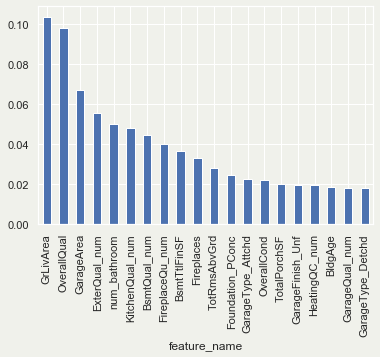

In [46]:
# Gradient Boosting Model
from sklearn.ensemble import GradientBoostingRegressor
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})

gbm = GradientBoostingRegressor()
gbm.set_params(learning_rate=0.01, n_estimators=5000, verbose=1, warm_start=False,loss='ls',max_features=2, min_impurity_decrease=0.01)
gbm.fit(X_train,y_train)
print(f'R^2 of Train set: {gbm.score(X_train,y_train)}')
print(f'R^2 Test set: {gbm.score(X_test,y_test)}')
sorted_importance = sorted(zip(X_train.columns, gbm.feature_importances_), key=lambda t:t[1], reverse=True)
a, b = zip(*sorted_importance) # this splits the list of tuples into two lists
pd.DataFrame({'feature_name':a, 'importance_score':b})[:20].plot.bar(x='feature_name',y='importance_score', legend=None)

Text(0, 0.5, 'Error')

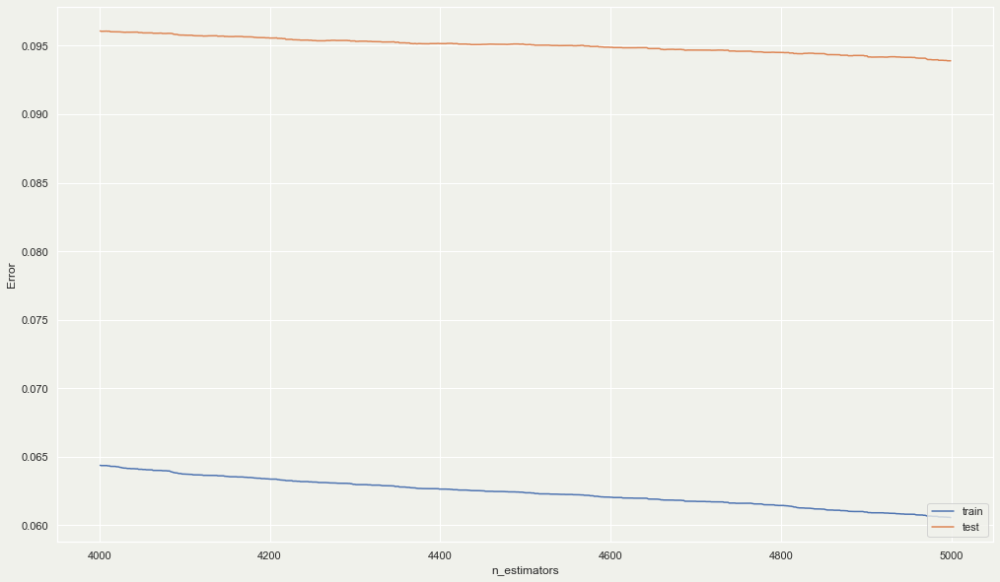

In [33]:
from sklearn.metrics import r2_score
# The staged_predict returns generators
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})

gen_train = gbm.staged_predict(X_train)
gen_test  = gbm.staged_predict(X_test)
trainR2 = []
testR2  = []
steps   = range(1,5000)
for n in steps:
    y_pred_train = next(gen_train)
    y_pred_test  = next(gen_test)
    trainR2.append(1-r2_score(y_pred_train, y_train))
    testR2.append(1-r2_score(y_pred_test, y_test))
start = 4000

plt.figure(figsize = (17,10))
plt.plot(steps[start:], trainR2[start:],label='train')
plt.plot(steps[start:], testR2[start:],label='test')
plt.legend(loc=4)
plt.xlabel('n_estimators')
plt.ylabel(r'Error')

### Lasso Regression

In [44]:
reg_lasso_cv = LassoCV(normalize = True, n_alphas = 200)
reg_lasso_cv.fit(X_train, y_train)
print(reg_lasso_cv.alpha_)

reg_lasso = Lasso(normalize=True)
reg_lasso.set_params(alpha = reg_lasso_cv.alpha_)
reg_lasso.fit(X_train, y_train)
lasso_coef_df = pd.DataFrame({'feature':X_train.columns,
                              'coef':reg_lasso.coef_})
num_feat = len(lasso_coef_df[lasso_coef_df['coef']!=0])
print(f'{num_feat} non-zero features')
lasso_coef_df[lasso_coef_df['coef']>0]


2.6944091985775396e-05
64 non-zero features


,feature,coef
0,GrLivArea,0.510552
2,OverallQual,0.058313
3,OverallCond,0.047768
6,Fireplaces,0.031625
7,GarageArea,0.000173
9,num_bathroom,0.026469
11,BsmtTtlFinSF,0.009638
15,ExterQual_num,0.010749
16,BsmtQual_num,0.016528
17,KitchenQual_num,0.014479


In [40]:
print(reg_lasso.score(X_train, y_train))
print(reg_lasso.score(X_test, y_test))

0.9157669554278522
0.9210315857049028


# Conclusion

- Linear regression model may be better at predicting Ames housing prices
- Housing price at Ames, Iowa is stable from 2006 to 2010
- We recommend that home buyers focus on the overall quality (overall material and finish) of the house first and foremost in order to maximize profit